## Open farm and run simple diagnostic


## Load packages

In [1]:
!pip install odc-ui rasterstats

  Using cached odc_ui-0.2.0a3-py3-none-any.whl (15 kB)
  Using cached rasterstats-0.19.0-py3-none-any.whl (16 kB)
  Using cached jupyter_ui_poll-0.2.2-py2.py3-none-any.whl (9.0 kB)
  Using cached simplejson-3.19.2-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (144 kB)


In [2]:
import time
start = time.time()

import warnings
warnings.filterwarnings('ignore')

In [10]:
%%time
from grits import get_field, get_lims, get_mms, query_l2a_items

# the basic
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

# for PC, stac, xarray
import stackstac
#from xrspatial import zonal_stats

# From DEA
import sys
sys.path.append('/home/jovyan/PlanetaryComputerExamples/grasspace/deafrica-sandbox-notebooks/Tools/deafrica_tools/')
from plotting import display_map, rgb, map_shapefile
from spatial import xr_rasterize
from bandindices import calculate_indices

# packages that have to be installed every runtime
import subprocess
import pkg_resources

required = {'rasterstats','odc-ui'}
installed = {pkg.key for pkg in pkg_resources.working_set}
missing = required - installed

if missing:
    python = sys.executable
    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

CPU times: user 2.93 ms, sys: 1.13 ms, total: 4.06 ms
Wall time: 16 s


## Área de análise
Using function get_field for 

1. for fields in a farm - OK
2. for a group in a group of farms - OK
3. for specific fields in a farm - OK
4. ToDo - for an entire farm - the simplest case, as if the polygon was already given straight from a file

In [9]:
path = '/home/jovyan/PlanetaryComputerExamples/vetorial/FAZENDAS/'

# daterange analysis
datetime = "2022-07-10/2023-10-10"


#### Área: Fazenda Uniguiri
**Column parte** contém as regiões

got bbox, lat_range, lon_range
    PID  area_ha    R   ID      SR     Re   Fi     TID  \
0  R8_4      6.4  R8_    4  100000  80000    4  180004   
1     F     10.6    F  NaN  100000  80000  901  180901   
2  R8_5      6.9  R8_    5  100000  80000    5  180005   
3     C      0.7    C  NaN  100000  80000  801  180801   
4  R8_1      6.7  R8_    1  100000  80000    1  180001   

                                            geometry  
0  MULTIPOLYGON (((-54.57526 -16.95986, -54.57705...  
1  MULTIPOLYGON (((-54.57224 -16.96252, -54.57131...  
2  MULTIPOLYGON (((-54.57705 -16.96167, -54.57526...  
3  MULTIPOLYGON (((-54.56787 -16.95268, -54.56744...  
4  MULTIPOLYGON (((-54.57109 -16.95544, -54.57249...  
CPU times: user 137 ms, sys: 84.8 ms, total: 222 ms
Wall time: 143 ms


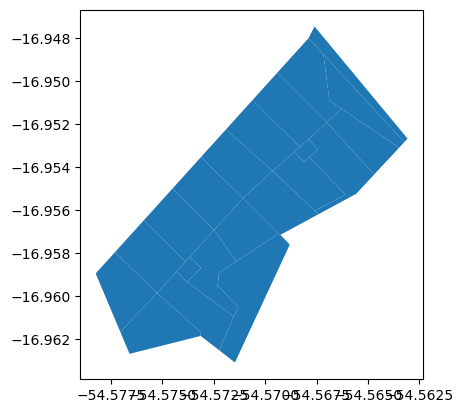

In [5]:
%%time
# para um grupo dentro de uma farm
# exemplo: regioes dentro de uma fazenda (fazenda_uniguiri)
layer = 'piquetes_tid'
column = 'Re'
#ID = 2

field = gpd.read_file( path + 'fazenda_uniguiri.gpkg' , layer=layer)
field = field[field[column] == 80000]

bbox, lat_range, lon_range = get_lims(field)

print(field.head())
field.plot();

In [6]:
style={'opacity': 6, 'stroke': 2,'dashArray': '1', 'fillOpacity': 0.5}
map_shapefile(field,'TID',cmap='Set1', **style )

Label(value='')

Map(center=[-16.955265352726073, -54.57066140325033], controls=(ZoomControl(options=['position', 'zoom_in_text…

#### Área: Iacanga - Cana

Grupo de talhoes dentro de todas fazendas de uma usina


### Display bbox study area
DREAM FUNCTION: sobrepor 'field'

In [ ]:
# Display from lat and lon range
display_map(x=lon_range, y=lat_range, zoom_bias = 0.3)

## Get images

### get Sentinel 2 L2A Data
colocar as especificidades aqui

In [11]:
%%time
items = query_l2a_items(bbox, datetime, 30)

 found 42 items
CPU times: user 77.2 ms, sys: 3.61 ms, total: 80.8 ms
Wall time: 357 ms


In [12]:
items

id: S2A_MSIL2A_20231010T134701_R024_T21KYB_20231010T214129
"bbox: [-55.128784, -17.26458963, -54.087006, -16.26099145]"
datetime: 2023-10-10T13:47:01.024000Z
platform: Sentinel-2A
proj:epsg: 32721
instruments: ['msi']
s2:mgrs_tile: 21KYB
constellation: Sentinel 2
s2:granule_id: S2A_OPER_MSI_L2A_TL_MSFT_20231010T214130_A043350_T21KYB_N05.09
eo:cloud_cover: 9.770323
s2:datatake_id: GS2A_20231010T134701_043350_N05.09


In [13]:
%%time
# For Sentinel 2
data = (
    stackstac.stack(
        items,
        assets = ["B11","B12","B08","B06", "B04", "B03","B02", "SCL"],    #["B12","B11","B08","B08","B05","B04","B03","B02"],  
        chunksize=256,
        #resolution=0.0001, #0.0001
        epsg=4326,
        bounds=bbox,
        properties = True,
        fill_value = np.nan,
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
    .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
)

# fix xy names
data = data.rename({'x': 'longitude','y': 'latitude'})

data

CPU times: user 50.1 ms, sys: 4.6 ms, total: 54.7 ms
Wall time: 53 ms


<xarray.DataArray 'stackstac-20c33e360dd0b14656b362ec3a8b679e' (time: 42,
                                                                band: 8,
                                                                latitude: 173,
                                                                longitude: 161)>
dask.array<where, shape=(42, 8, 173, 161), dtype=float64, chunksize=(1, 1, 173, 161), chunktype=numpy.ndarray>
Coordinates: (12/44)
  * time                                     (time) datetime64[ns] 2022-07-12...
    id                                       (time) <U54 'S2B_MSIL2A_20220712...
  * band                                     (band) object 'swir16' ... None
  * longitude                                (longitude) float64 -54.58 ... -...
  * latitude                                 (latitude) float64 -16.95 ... -1...
    s2:reflectance_conversion_factor         (time) float64 0.9674 ... 1.001
    ...                                       ...
    gsd                                      (band) float64 20.0 20.0 ... 20.0
    proj:bbox                                object {699960.0, 809760.0, 8090...
    common_name                              (band) object 'swir16' ... None
    center_wavelength                        (band) object 1.61 2.19 ... None
    full_width_half_max                      (band) object 0.143 0.242 ... None
    epsg                                     int64 4326
Attributes:
    spec:           RasterSpec(epsg=4326, bounds=(-54.57825604339398, -16.963...
    crs:            epsg:4326
    transform:      | 0.00, 0.00,-54.58|\n| 0.00,-0.00,-16.95|\n| 0.00, 0.00,...
    resolution_xy:  (9.439942722622163e-05, 9.118049409906348e-05)

### Mask dataset com fazenda

In [14]:
%%time
#create mask versao dataarray
mask = xr_rasterize(field,data,
                    # x_dim='x',
                    # y_dim='y',
                   #export_tiff='masked2.tiff',
                   ) 

# #mask data
data = data.where(mask)

# #convert to float 32 to conserve memory
data = data.astype(np.float32)
data

CPU times: user 24.2 ms, sys: 0 ns, total: 24.2 ms
Wall time: 21.3 ms


<xarray.DataArray 'stackstac-20c33e360dd0b14656b362ec3a8b679e' (time: 42,
                                                                band: 8,
                                                                latitude: 173,
                                                                longitude: 161)>
dask.array<astype, shape=(42, 8, 173, 161), dtype=float32, chunksize=(1, 1, 173, 161), chunktype=numpy.ndarray>
Coordinates: (12/44)
  * time                                     (time) datetime64[ns] 2022-07-12...
    id                                       (time) <U54 'S2B_MSIL2A_20220712...
  * band                                     (band) object 'swir16' ... None
  * longitude                                (longitude) float64 -54.58 ... -...
  * latitude                                 (latitude) float64 -16.95 ... -1...
    s2:reflectance_conversion_factor         (time) float64 0.9674 ... 1.001
    ...                                       ...
    gsd                                      (band) float64 20.0 20.0 ... 20.0
    proj:bbox                                object {699960.0, 809760.0, 8090...
    common_name                              (band) object 'swir16' ... None
    center_wavelength                        (band) object 1.61 2.19 ... None
    full_width_half_max                      (band) object 0.143 0.242 ... None
    epsg                                     int64 4326
Attributes:
    spec:           RasterSpec(epsg=4326, bounds=(-54.57825604339398, -16.963...
    crs:            epsg:4326
    transform:      | 0.00, 0.00,-54.58|\n| 0.00,-0.00,-16.95|\n| 0.00, 0.00,...
    resolution_xy:  (9.439942722622163e-05, 9.118049409906348e-05)

In [15]:
# calcula indices
ds_ = data.to_dataset(dim='band')

# os indices
indices = ["LAI", "EVI","NDCI", "BSI"]
ds = calculate_indices(ds_, 
                       index= indices, 
                       satellite_mission='s2', 
                       drop=True);

Dropping bands ['swir16', 'swir22', 'nir', 'rededge', 'red', 'green', 'blue', None]


### CALCULATE Z-SCORE
peguei ideia no Bard

In [10]:
#grouped_ds = datam2.groupby('time.month')
grouped_ds = ds.groupby('time.month') # unmasked # unfiltered
grouped_ds

DatasetGroupBy, grouped over 'month'
12 groups with labels 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12.

In [13]:
def calculate_zscore(da):
    mean = da.mean()
    std = da.std()
    zscore = (da - mean) / std
    return zscore

# Apply the function to each month
zscore = grouped_ds.apply(calculate_zscore)
zscore

<xarray.Dataset>
Dimensions:                                  (time: 215, longitude: 161,
                                              latitude: 173, band: 8)
Coordinates: (12/43)
  * time                                     (time) datetime64[ns] 2017-07-13...
    id                                       (time) <U54 'S2A_MSIL2A_20170713...
  * longitude                                (longitude) float64 -54.58 ... -...
  * latitude                                 (latitude) float64 -16.95 ... -1...
    s2:dark_features_percentage              (time) float64 0.2284 ... 0.02724
    s2:saturated_defective_pixel_percentage  float64 0.0
    ...                                       ...
    proj:bbox                                object {699960.0, 809760.0, 8090...
    gsd                                      (band) float64 20.0 20.0 ... 20.0
    common_name                              (band) object 'swir16' ... None
    center_wavelength                        (band) object 1.61 2.19 ... None
    full_width_half_max                      (band) object 0.143 0.242 ... None
    epsg                                     int64 4326
Dimensions without coordinates: band
Data variables:
    LAI                                      (time, latitude, longitude) float32 dask.array<chunksize=(1, 173, 161), meta=np.ndarray>
    EVI                                      (time, latitude, longitude) float32 dask.array<chunksize=(1, 173, 161), meta=np.ndarray>
    NDCI                                     (time, latitude, longitude) float32 dask.array<chunksize=(1, 173, 161), meta=np.ndarray>
    BSI                                      (time, latitude, longitude) float32 dask.array<chunksize=(1, 173, 161), meta=np.ndarray>

In [ ]:
%%time
ds.compute();

#### Visualizing RGB images sequence

CPU times: user 1.41 s, sys: 507 ms, total: 1.92 s
Wall time: 1.36 s


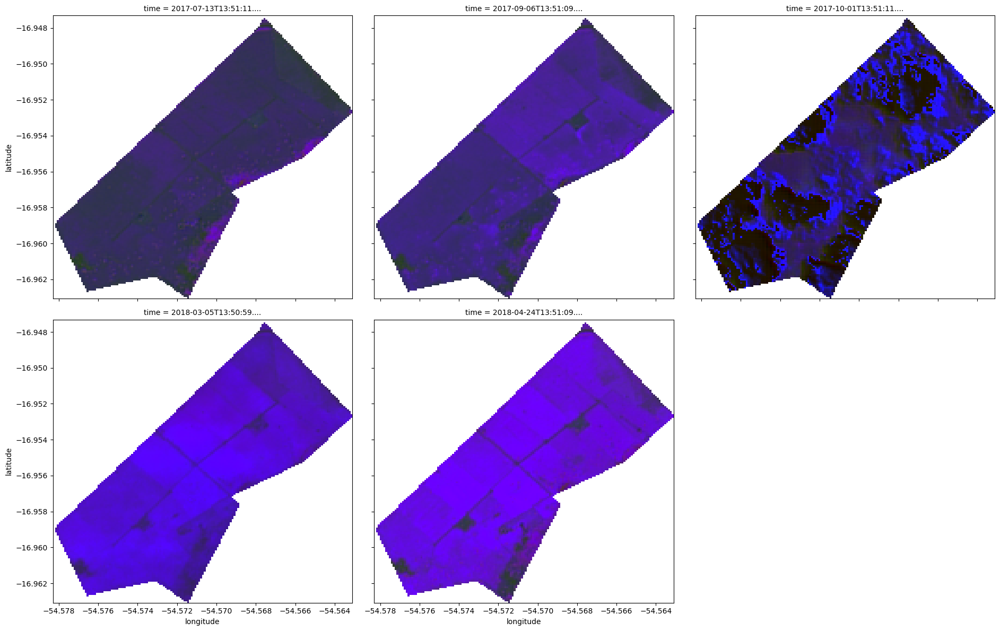

In [15]:
%%time
# the case of three indices in a RGB composition 
rgb(ds, bands = ["NDCI","BSI","LAI"],index=[0,3,6,9,12] , 
    size=6, col_wrap=3,
   percentile_stretch=(0.02,0.98),
   aspect=1)

#### Plot Indices for specific dates

In [16]:
%%time
# get mins and maxs for each variable in the dataset

qmin_qmax=[0.02, 0.98]
mms = get_mms(ds, indices, qmin_qmax)

{'LAI': array([0.3128237 , 2.53853302]), 'EVI': array([0.11907786, 0.73425453]), 'NDCI': array([0.08723913, 0.55277329]), 'BSI': array([-0.20552925,  0.19869156])}
CPU times: user 6.98 s, sys: 1.43 s, total: 8.41 s
Wall time: 7.57 s


### Monthly mean and std, 
**GOAL > Z-SCORES IN ANOTHER PLOT (FOR THE WHOLE SERIES)**


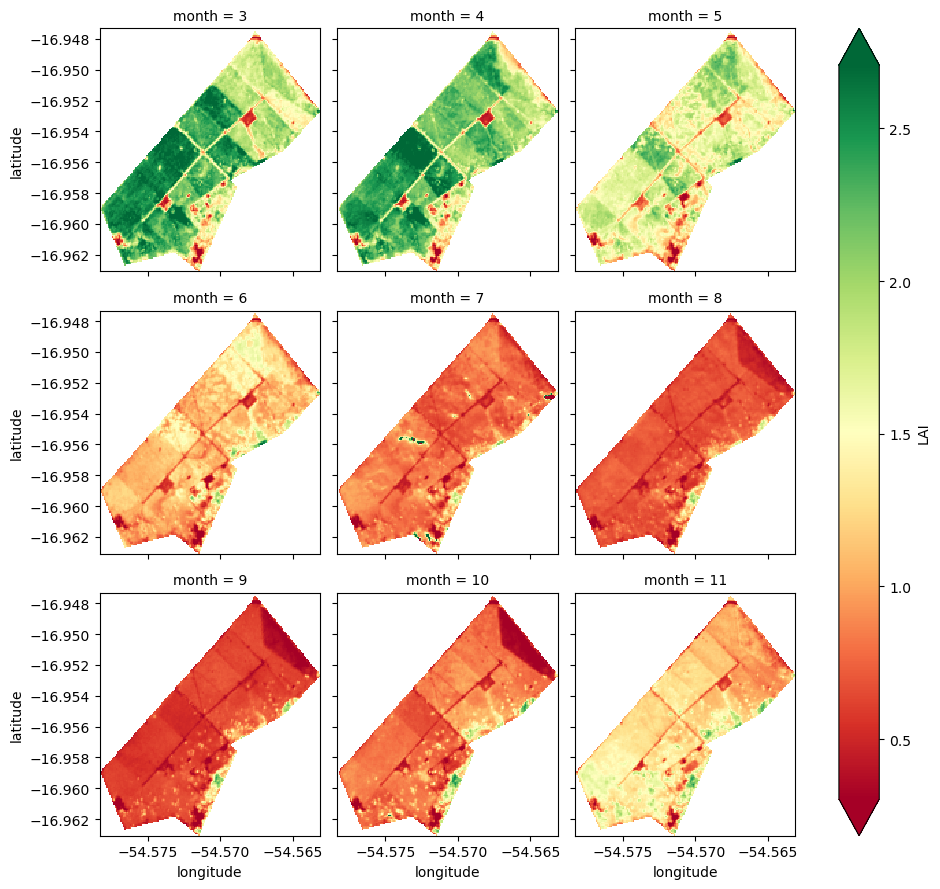

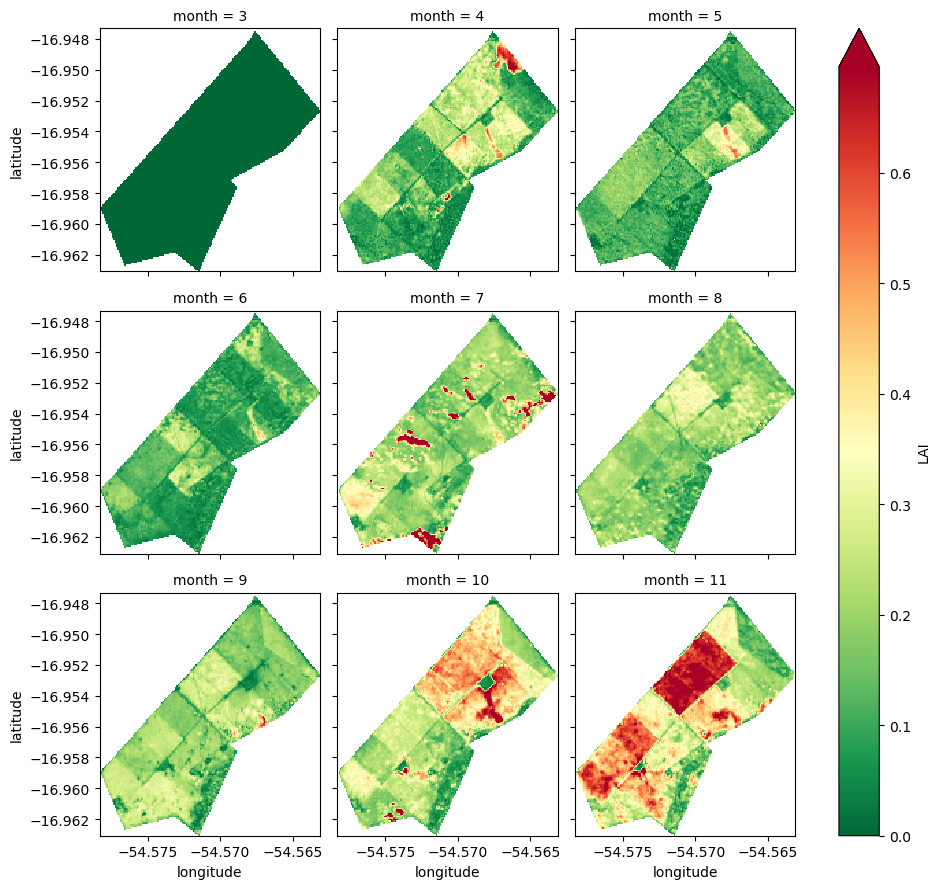

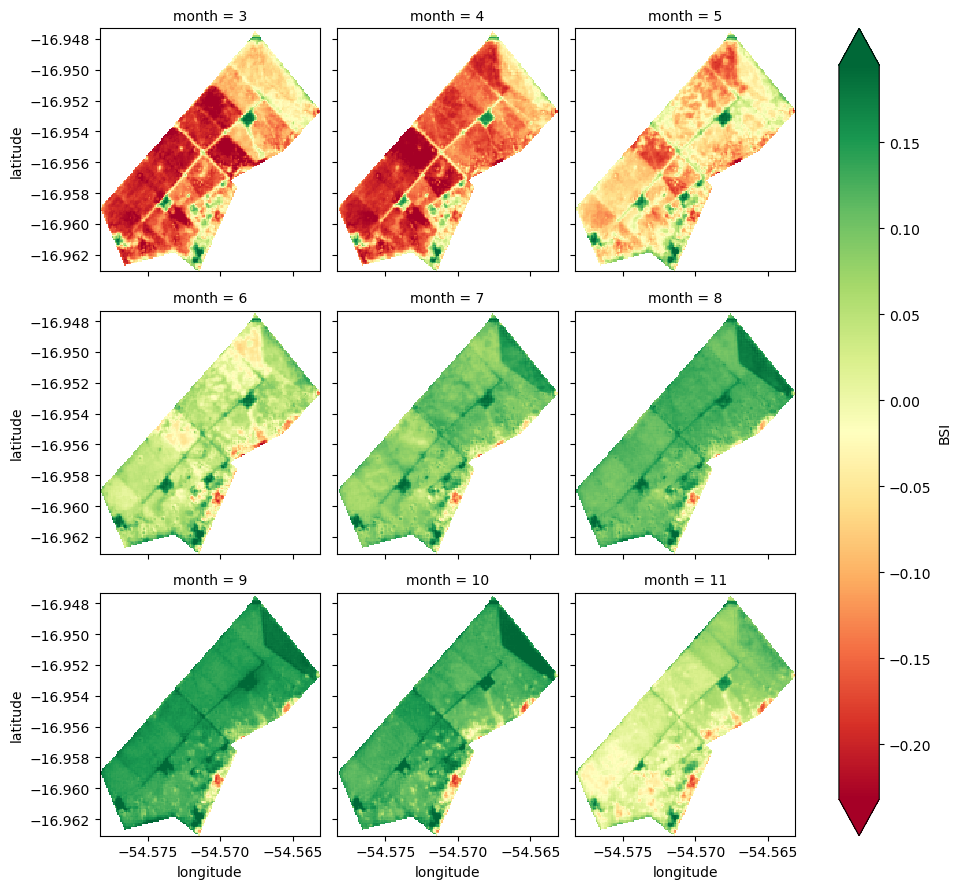

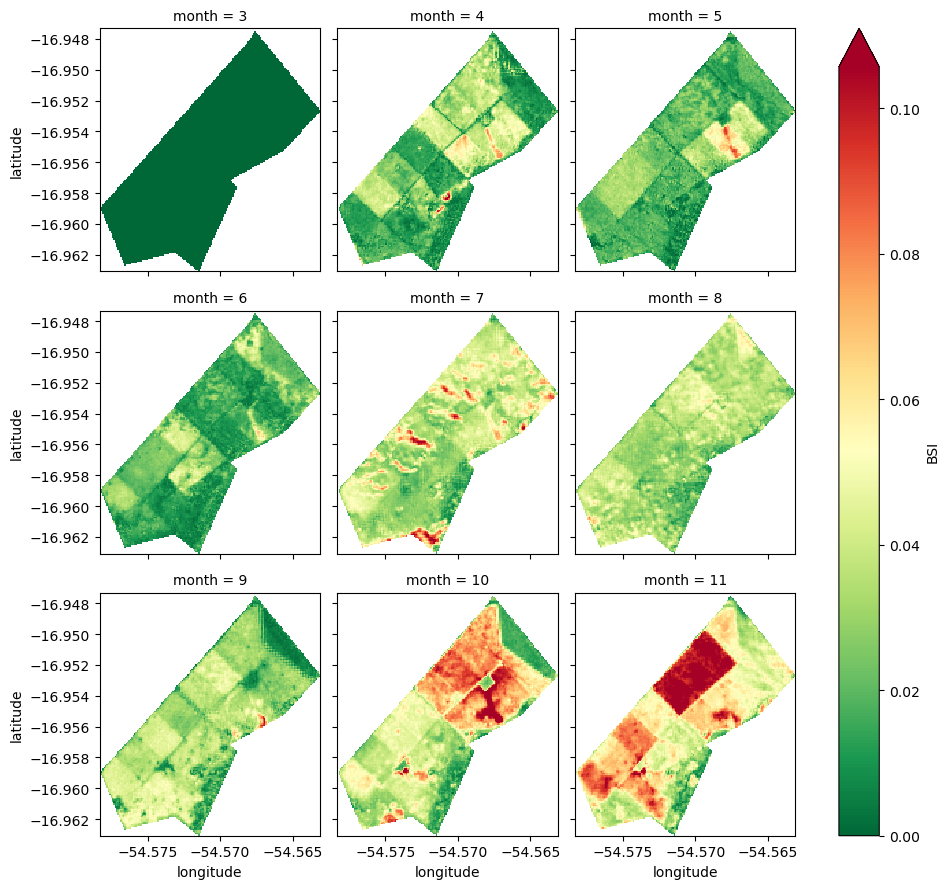

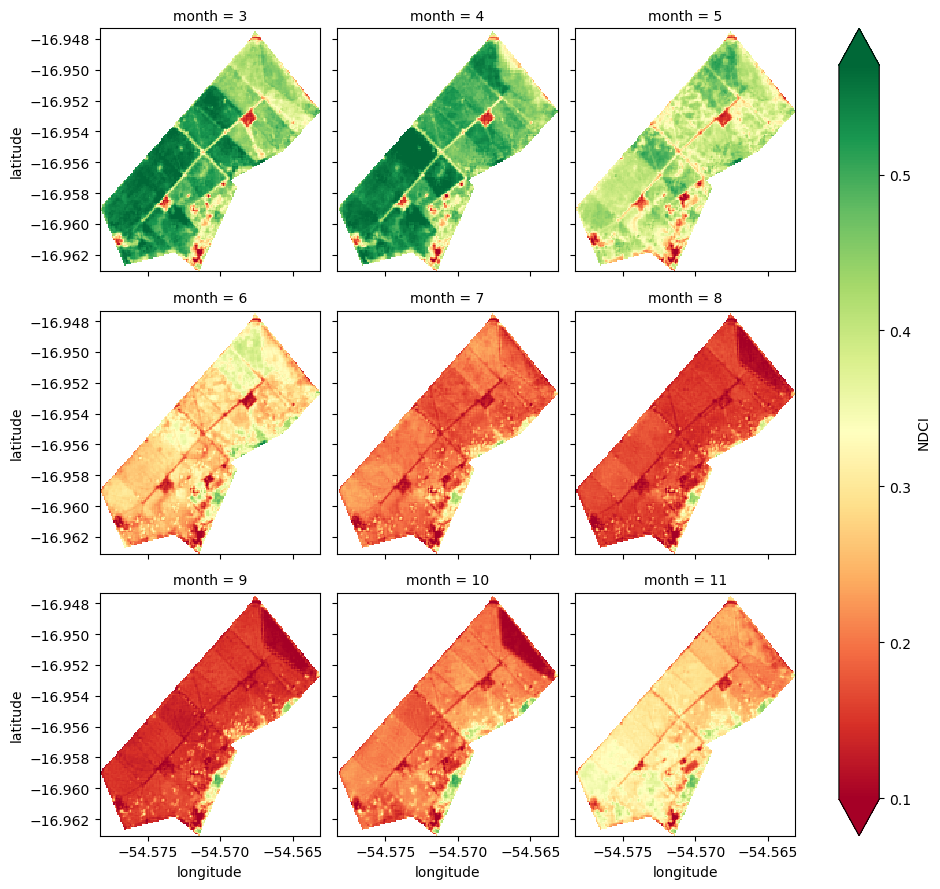

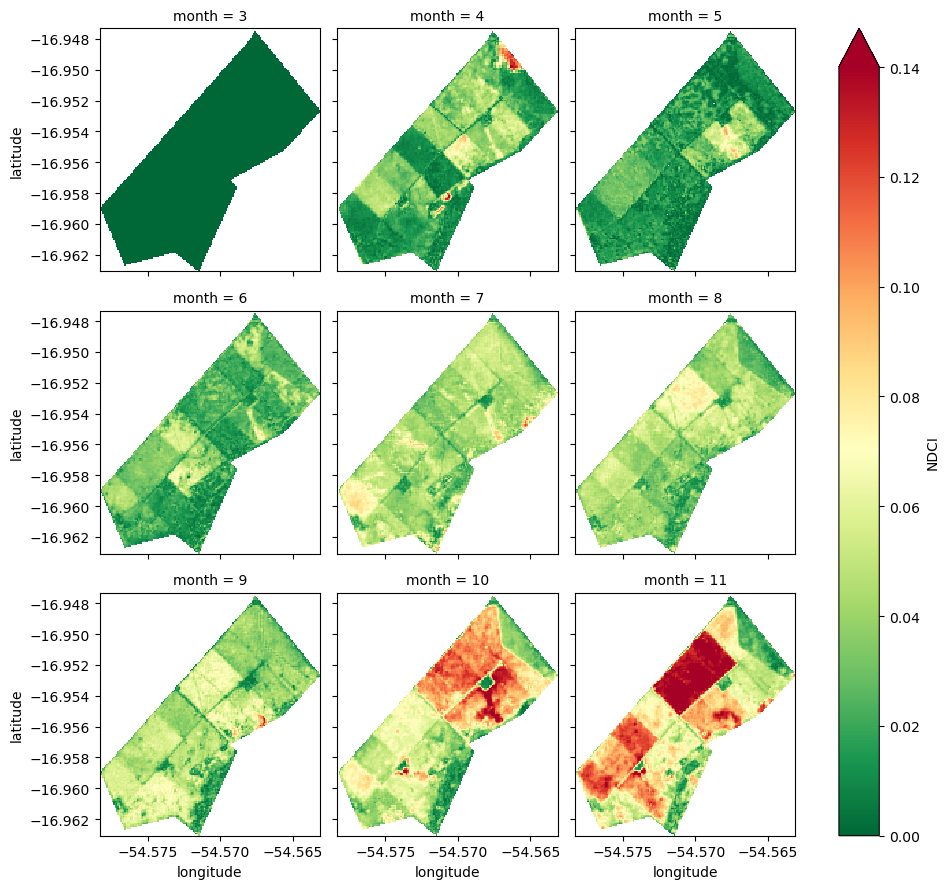

In [18]:
i1,i2,i3 = 'LAI', 'BSI', 'NDCI'


for i in [i1,i2,i3]:
    dsmean = ds[i].chunk(dict(time=-1)).interpolate_na(dim='time').groupby('time.month').mean()
    dsstd = ds[i].chunk(dict(time=-1)).interpolate_na(dim='time').groupby('time.month').std()
    mm_mean = np.nanquantile(dsmean.values,[0.01,0.99])
    mm_std = np.nanquantile(dsstd.values,[0.01,0.99])
    
    dsmean.plot(col='month', cmap = 'RdYlGn', 
                vmin = mm_mean[0], vmax = mm_mean[1], col_wrap=3)
    
    dsstd.plot(col='month', cmap = 'RdYlGn_r', 
                vmin = mm_std[0], vmax = mm_std[1], col_wrap=3);


#### Indices time-series plots

In [16]:
len(ds_.time)

215

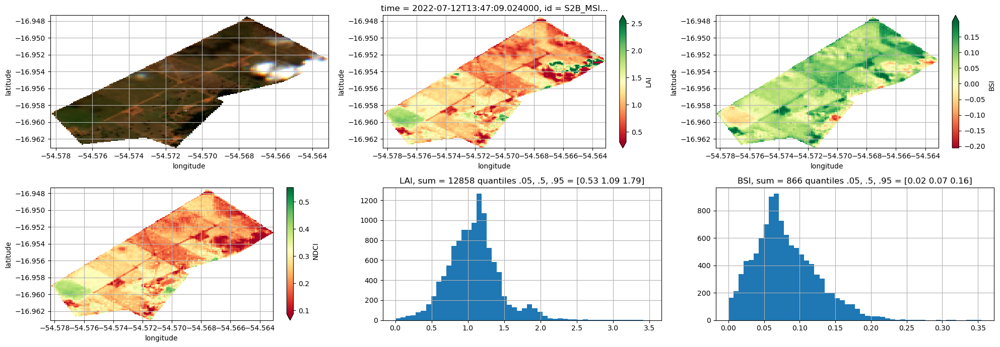

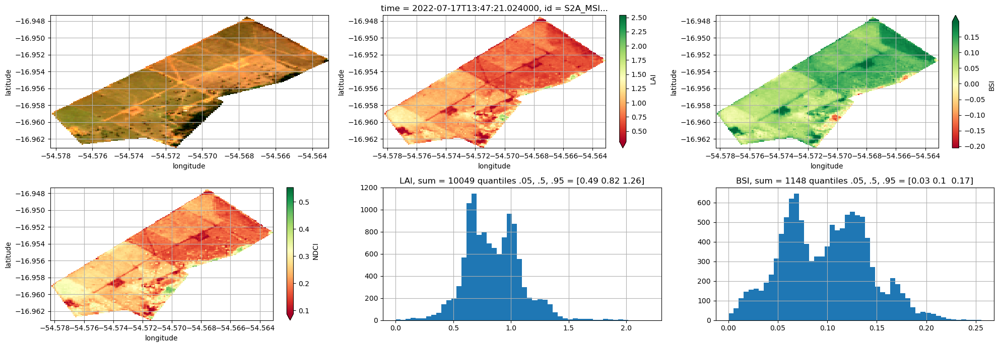

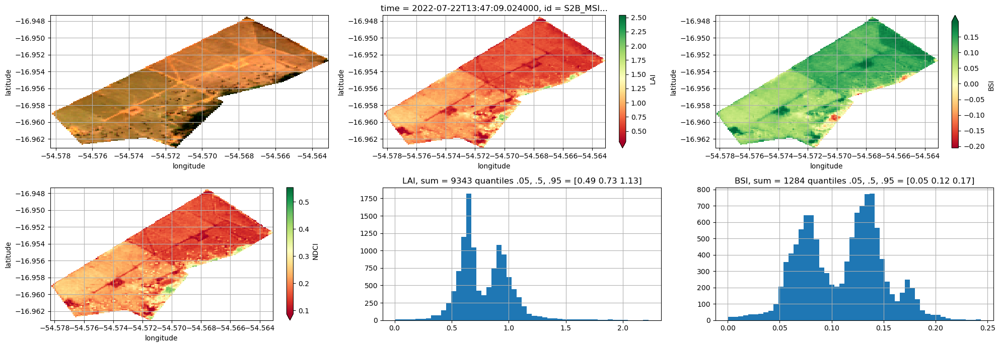

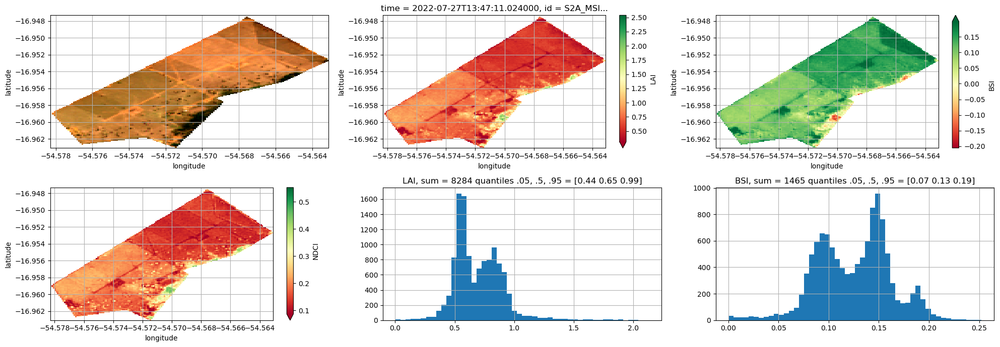

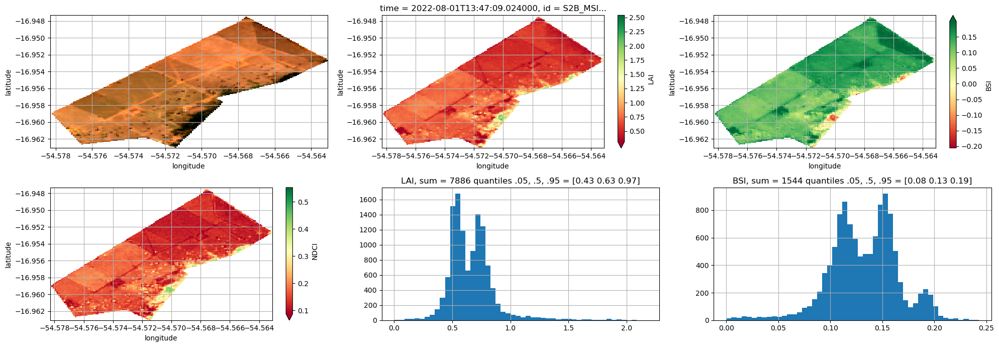

...

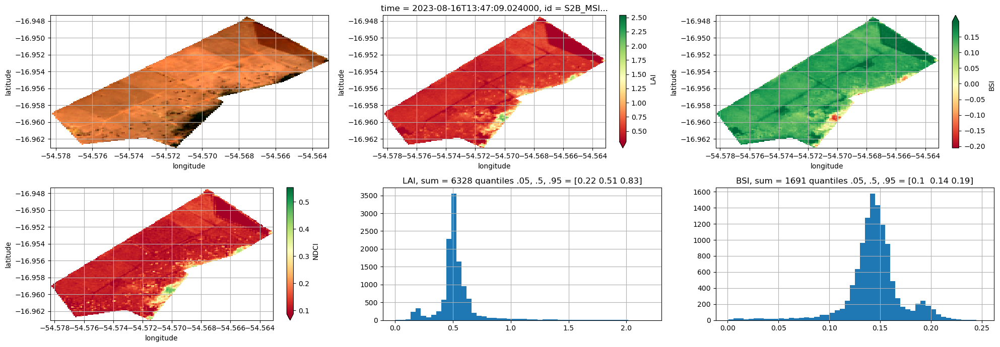

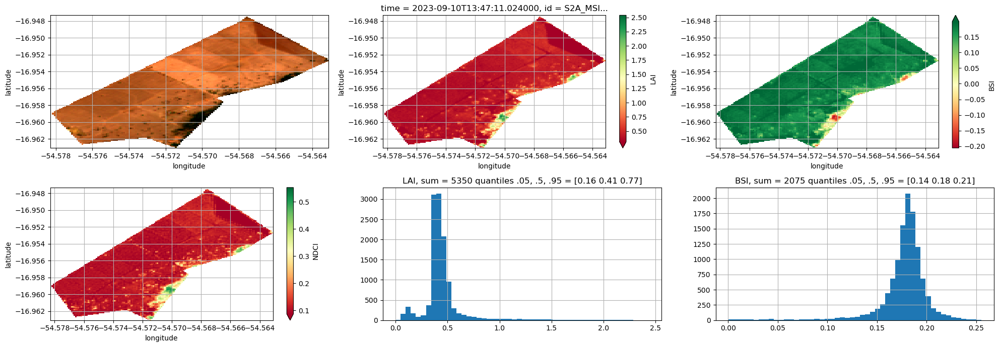

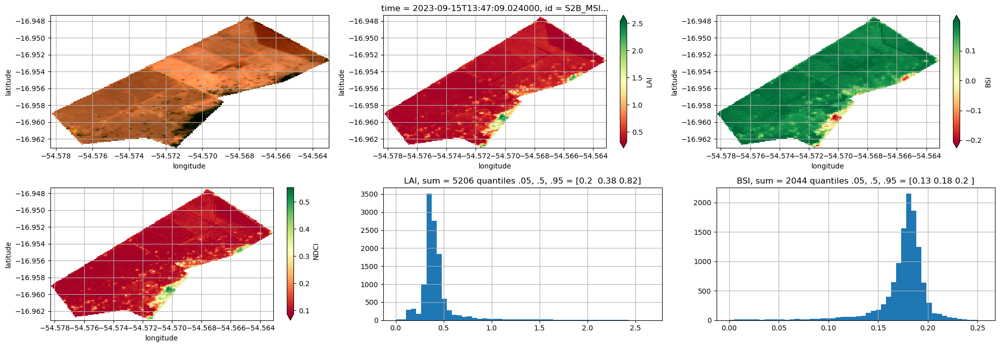

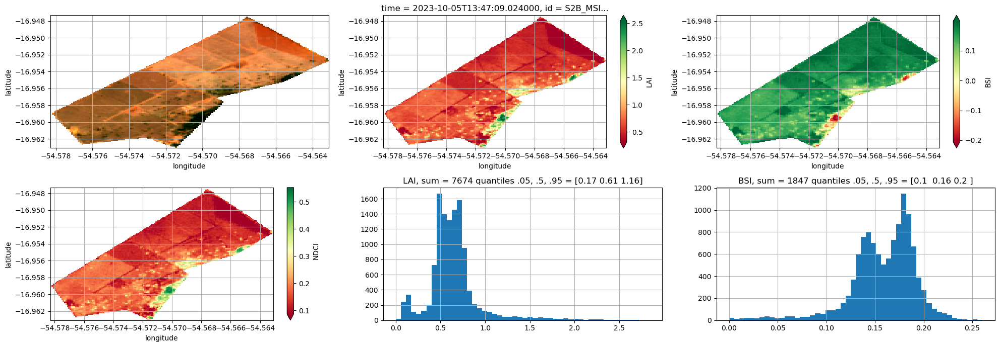

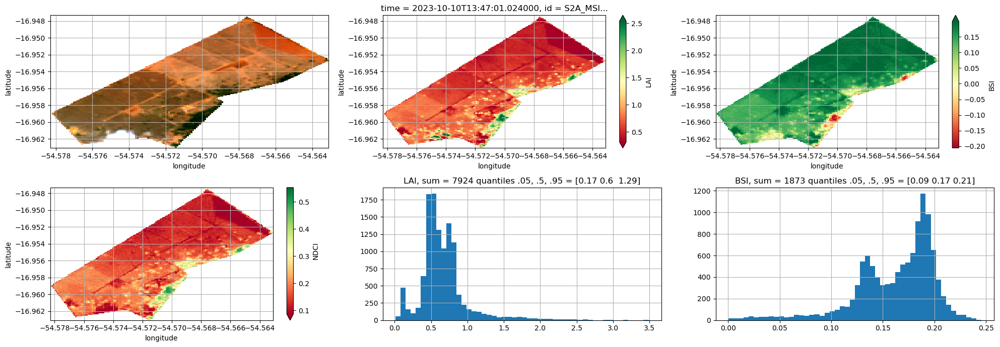

In [19]:
step = 1
t = 1

for t in range(0, len(ds_.time),step):
    fig, ((ax1,ax2,ax3), (ax4,ax5,ax6))  = plt.subplots(2, 3,figsize=(20,7))

    rgb(ds_,index=[t],percentile_stretch=(0.02,0.98), ax=ax1, aspect=1)
    ax1.set_title(None)
    ax1.grid()

    ds[i1].isel(time=[t]).plot(cmap = 'RdYlGn', vmin = mms[i1][0], vmax = mms[i1][1], ax=ax2)
    ax2.grid()

    flat = ds[i1].isel(time=[t]).values.flatten()
    flat = np.where((flat> 3.5) | (flat<0), np.nan, flat)
    ax5.hist(flat,50)
    ax5.grid()
    ax5.set_title(f'{i1}, sum = {np.nansum(flat):.0f} quantiles .05, .5, .95 = {np.round(np.nanquantile(flat,[.05,.5,.95]),2)}')

    ds[i2].isel(time=[t]).plot(cmap = 'RdYlGn', vmin = mms[i2][0], vmax = mms[i2][1], ax=ax3)
    ax3.set_title(None);
    ax3.grid()


    flat = ds[i2].isel(time=[t]).values.flatten()
    flat = np.where((flat> 3.5) | (flat<0), np.nan, flat)
    ax6.hist(flat, bins=50)
    ax6.grid()
    ax6.set_title(f'{i2}, sum = {np.nansum(flat):.0f} quantiles .05, .5, .95 = {np.round(np.nanquantile(flat,[.05,.5,.95]),2)}')

    ds[i3].isel(time=[t]).plot(cmap = 'RdYlGn', vmin = mms[i3][0], vmax = mms[i3][1], ax=ax4)
    ax4.set_title(None);
    ax4.grid()

    fig.tight_layout();   
    plt.show();plt.close()

In [ ]:
zscore